In [1]:
import tensorflow as tf
import tensorflow_io as tfio
import os
import glob
import matplotlib.pyplot as plt
import tifffile
from tqdm import tqdm
import pickle
#from transformers import TFSegformerForSemanticSegmentation
import pandas as pd

from PIL import Image
import cv2
import numpy as np

2024-02-22 18:48:11.240524: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-22 18:48:11.240663: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-22 18:48:11.408165: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
with open('/kaggle/input/train-test-split-and-norm-statistics/subset_for_comparison.pkl', 'rb') as f:
    image_names = pickle.load(f)

In [3]:
images_dir = '/kaggle/input/track1/Track1/train/images'
labels_dir = '/kaggle/input/track1/Track1/train/labels'
naivepreds_dir = '/kaggle/input/predictions-bestmodels/subset_naivepreds'
unetpreds_dir = '/kaggle/input/predictions-bestmodels/subset_unetpreds'
segformerpreds_dir =  '/kaggle/input/predictions-bestmodels/subset_segformerpreds'

In [4]:
# to ensure the order, generate all 
images_names = sorted(image_names)
labels_names = [i.replace('.tif','.png') for i in images_names]
naivepreds_names = [i.replace('.tif', '_mask.png') for i in images_names]
unetpreds_names= [i.replace('.tif', '_mask.png') for i in images_names]
segformerpreds_names= [i.replace('.tif', '.png') for i in images_names]

In [5]:
for i in zip(naivepreds_names,unetpreds_names, segformerpreds_names):
    if i[0][:-9] != i[1][:-9] or i[0][:-9] != i[2][:-4]:
        print(i)
        print("Not the same")
    else:
        pass

In [6]:
image_size = 512

In [7]:
def parse_image(file_path):
    image = tf.convert_to_tensor(np.array(tifffile.imread(file_path)))[:,:,5]
    return image
def parse_mask(file_path):
    mask = tf.io.read_file(file_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, [image_size, image_size], method='nearest')
    mask = tf.squeeze(mask)  # Ensure it's a 2D tensor for the mask
    mask.set_shape([image_size, image_size])
    return mask

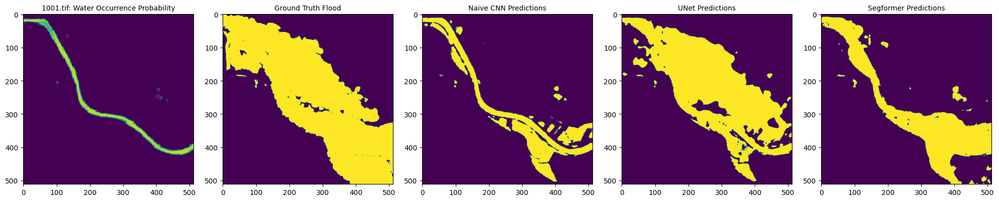

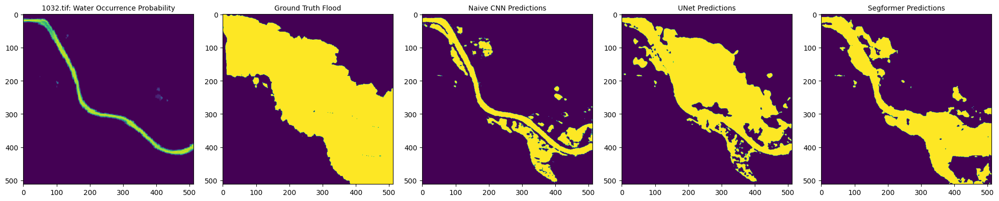

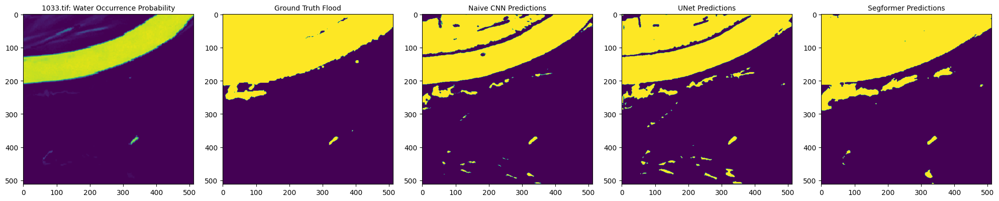

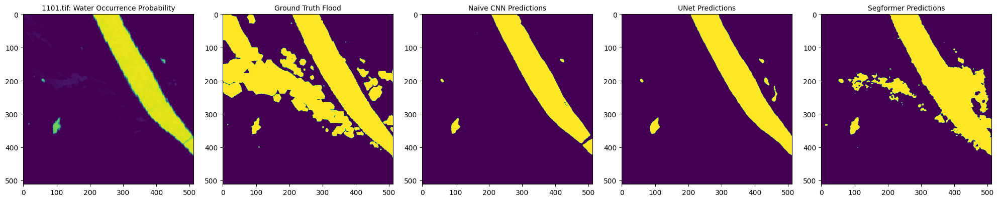

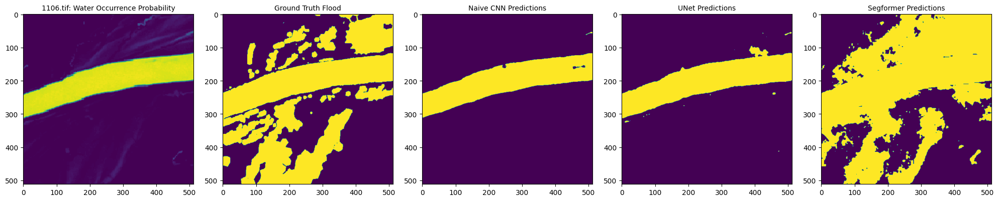

...

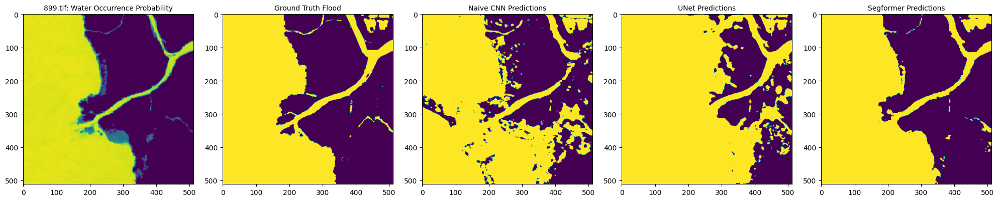

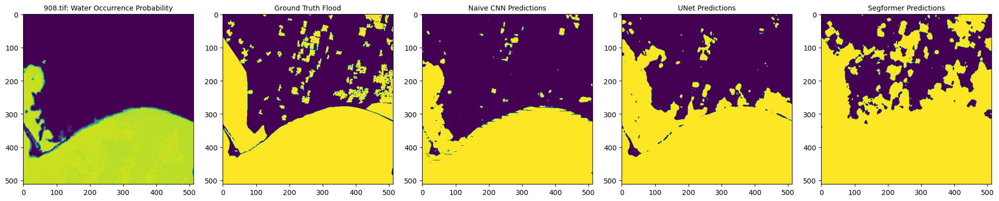

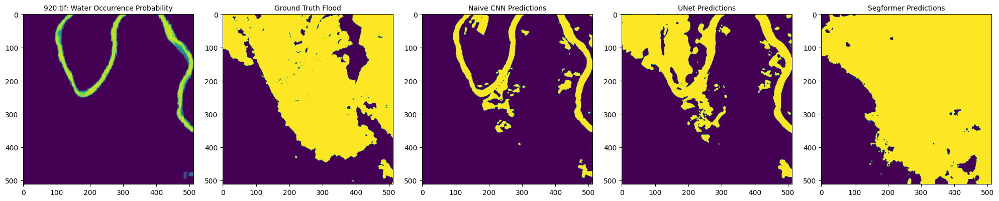

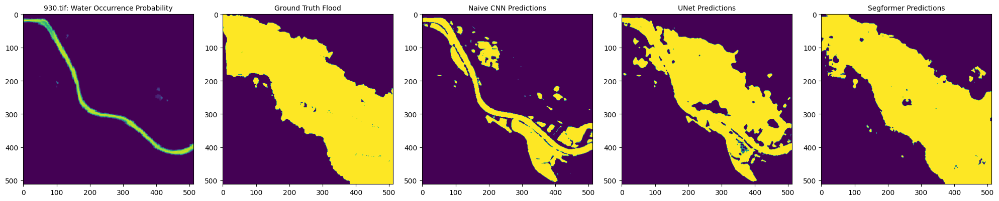

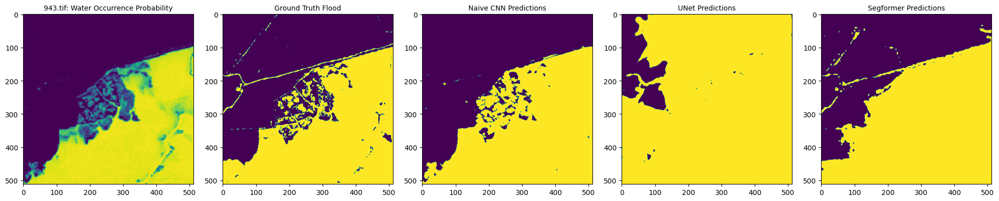

In [23]:
for i in range(len(images_names)):
    image = parse_image(os.path.join(images_dir, images_names[i]))
    label = parse_mask(os.path.join(labels_dir, labels_names[i]))
    naivepred = parse_mask(os.path.join(naivepreds_dir, naivepreds_names[i]))
    unetpred = parse_mask(os.path.join(unetpreds_dir, unetpreds_names[i]))
    segformerpred = parse_mask(os.path.join(segformerpreds_dir, segformerpreds_names[i]))

    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    axes[0].imshow(image, cmap='viridis')
    axes[0].set_title(images_names[i] +': Water Occurrence Probability', fontsize=10)

    axes[1].imshow(label, cmap='viridis')
    axes[1].set_title('Ground Truth Flood', fontsize=10)

    axes[2].imshow(naivepred, cmap='viridis')
    axes[2].set_title('Naive CNN Predictions', fontsize=10)

    axes[3].imshow(unetpred, cmap='viridis')
    axes[3].set_title('UNet Predictions', fontsize=10)

    axes[4].imshow(segformerpred, cmap='viridis')
    axes[4].set_title('Segformer Predictions', fontsize=10)

    plt.tight_layout()

    plt.show()

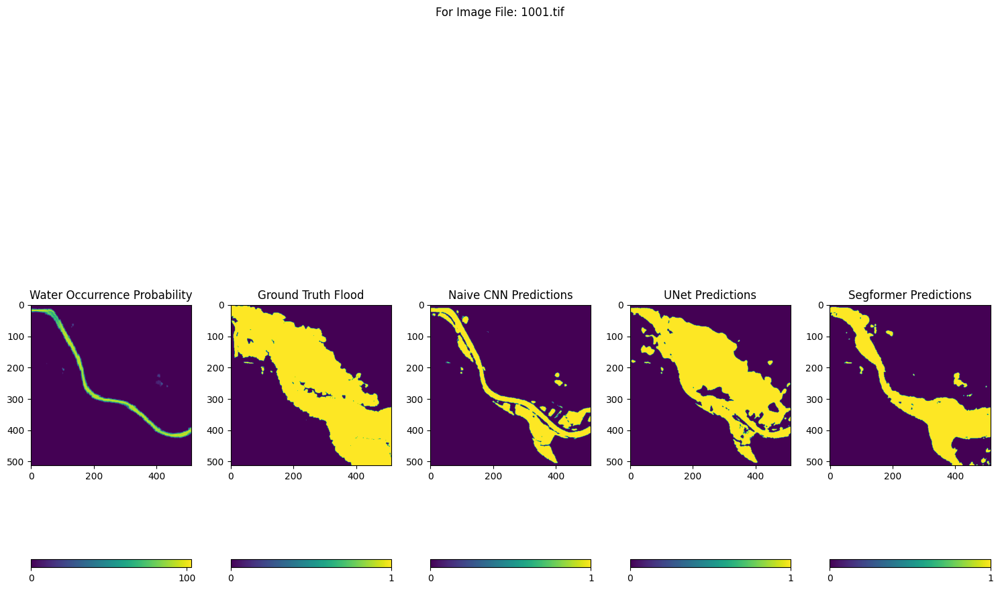

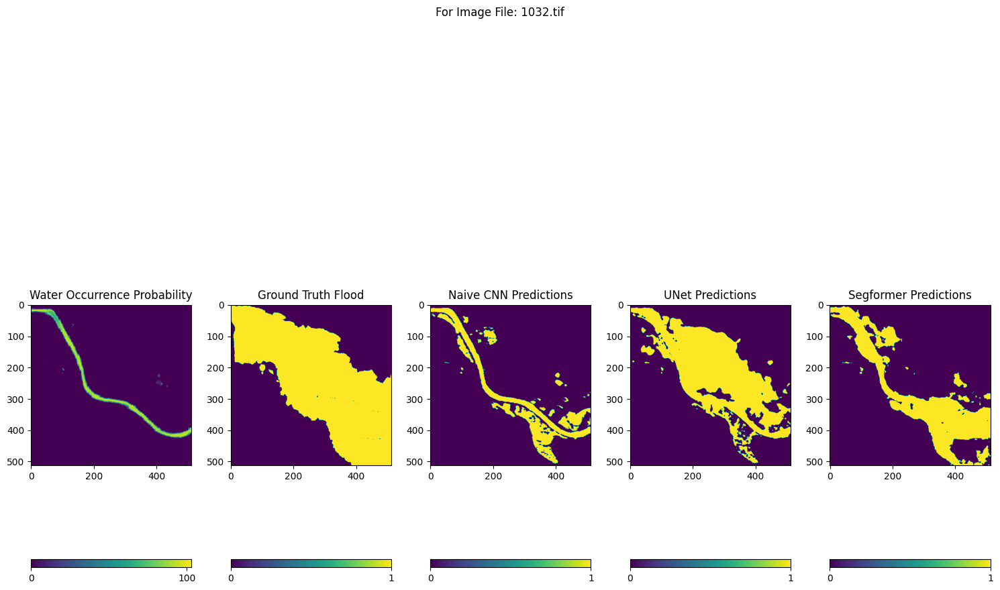

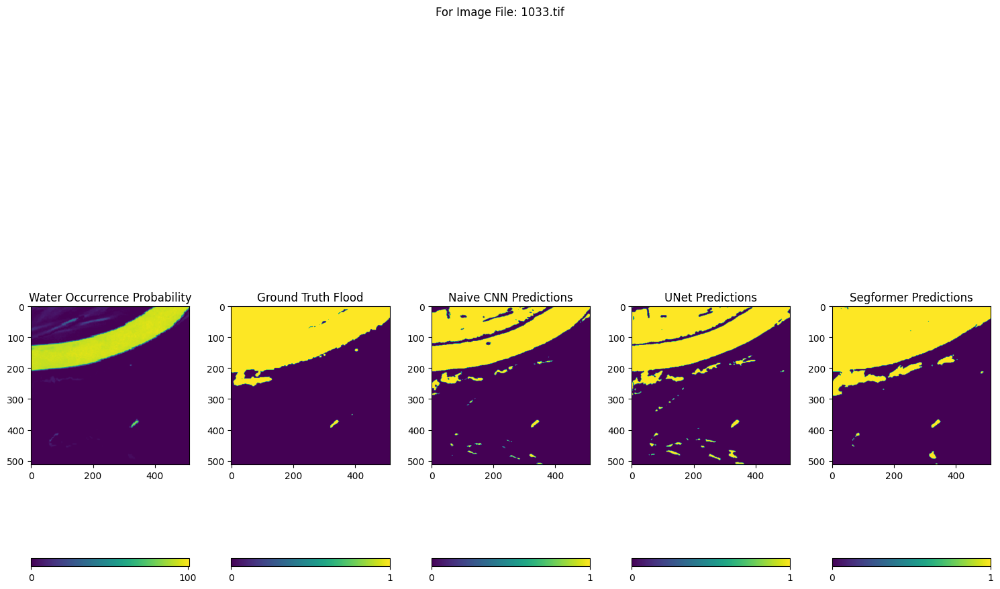

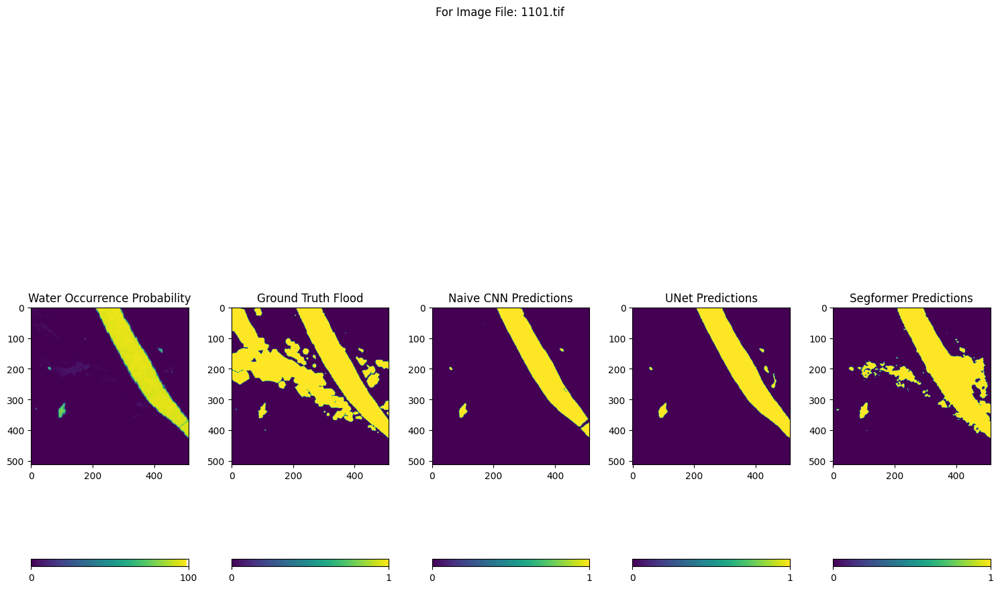

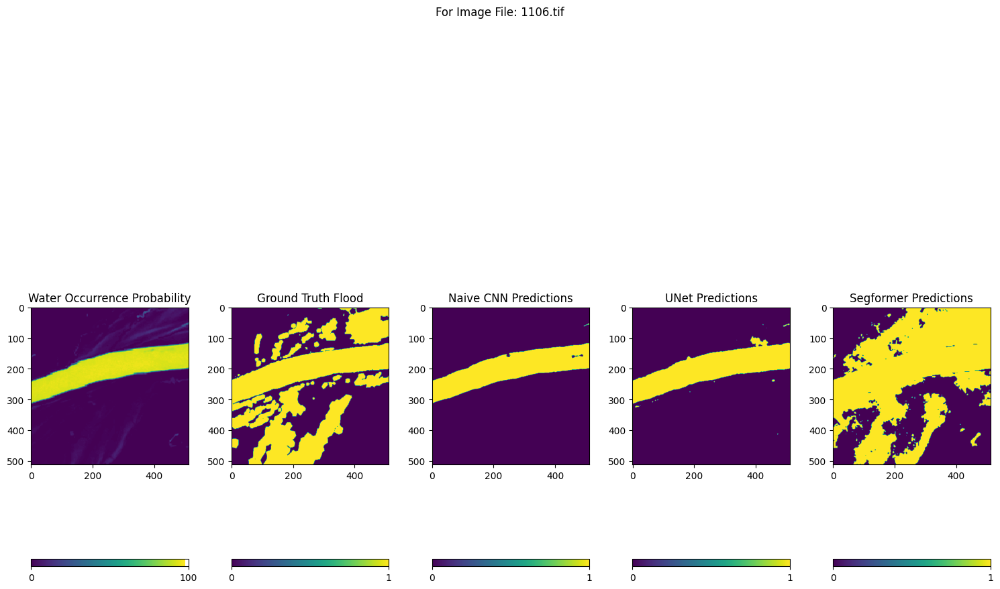

...

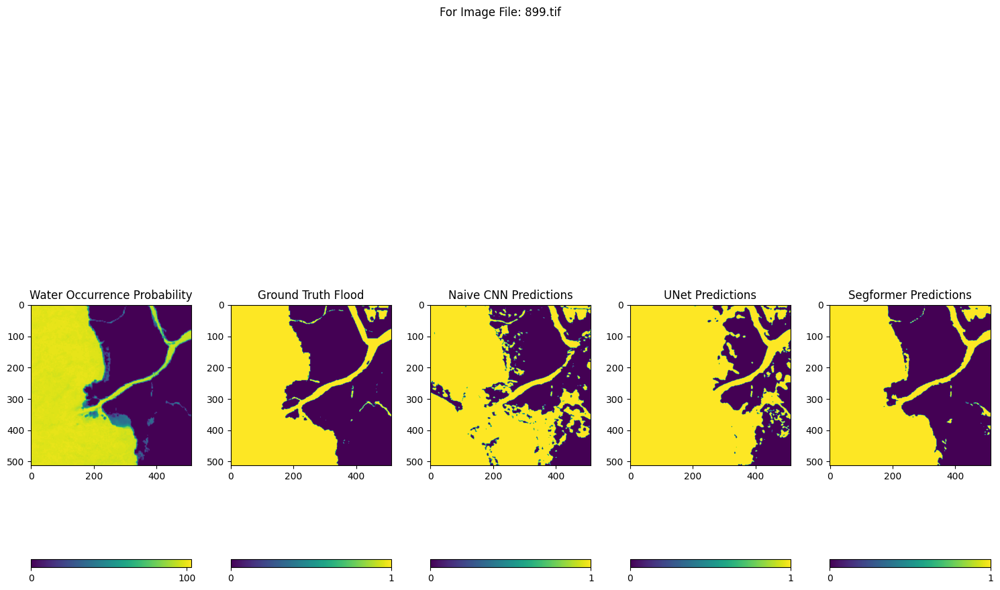

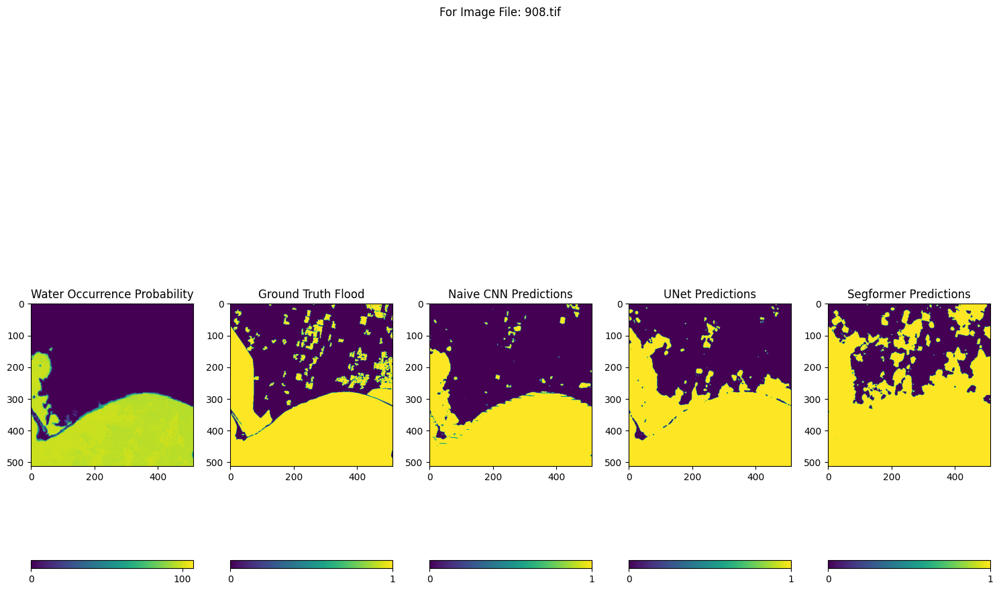

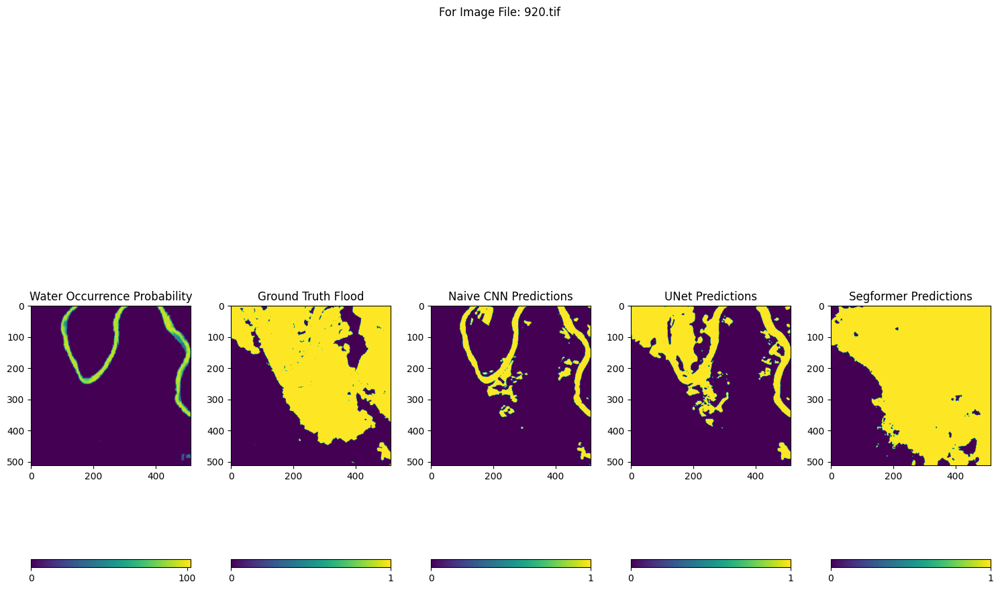

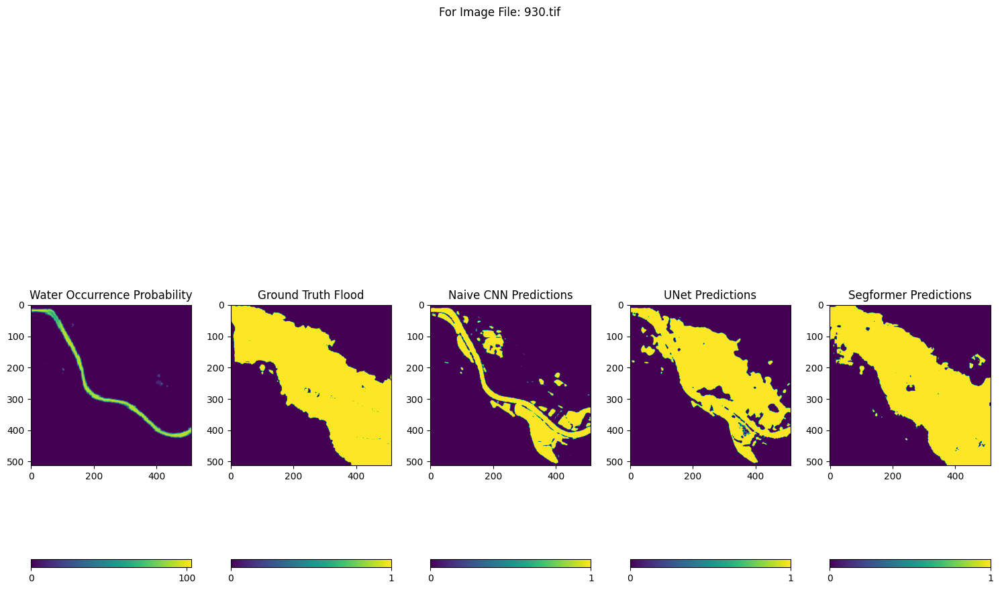

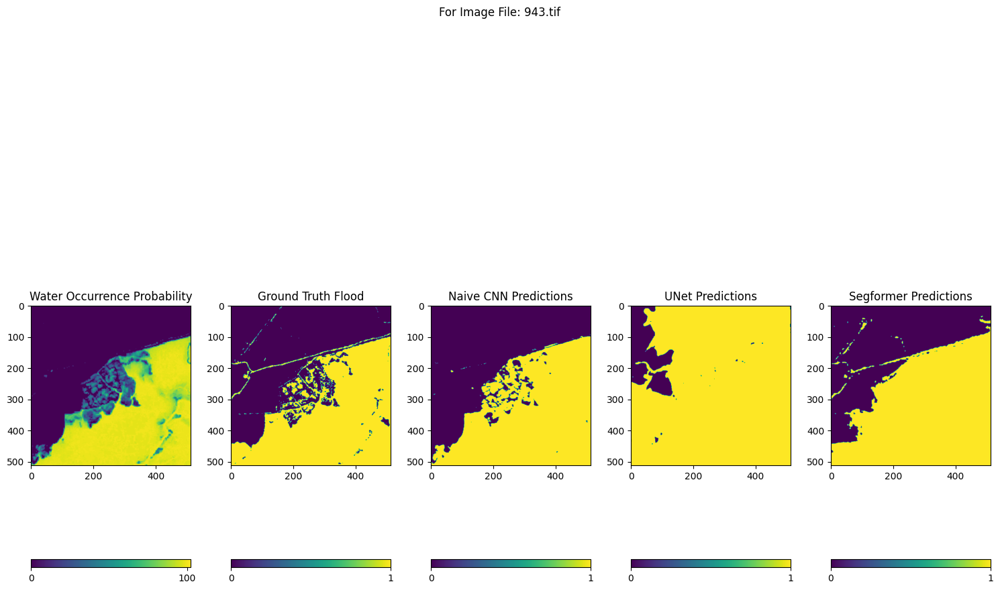

In [38]:
# rewrite above code to reduce space between super title and subplots. Only min and max ticks on colorbars and finally, reduce space between colorbars and the plots

for i in range(len(images_names)):
    image = parse_image(os.path.join(images_dir, images_names[i]))
    label = parse_mask(os.path.join(labels_dir, labels_names[i]))
    naivepred = parse_mask(os.path.join(naivepreds_dir, naivepreds_names[i]))
    unetpred = parse_mask(os.path.join(unetpreds_dir, unetpreds_names[i]))
    unetpred = tf.where(unetpred > 0, 1, 0)
    segformerpred = parse_mask(os.path.join(segformerpreds_dir, segformerpreds_names[i]))

    fig, axes = plt.subplots(1, 5, figsize=(15, 10))
    
    im0 = axes[0].imshow(image, cmap='viridis')
    axes[0].set_title('Water Occurrence Probability', fontsize=12)
    cbar0 = plt.colorbar(im0, ax=axes[0], orientation='horizontal')
    cbar0.set_ticks([0, 100])

    im1 = axes[1].imshow(label, cmap='viridis')
    axes[1].set_title('Ground Truth Flood', fontsize=12)
    cbar1 = plt.colorbar(im1, ax=axes[1], orientation='horizontal')
    cbar1.set_ticks([0, 1])

    im2 = axes[2].imshow(naivepred, cmap='viridis')
    axes[2].set_title('Naive CNN Predictions', fontsize=12)
    cbar2 = plt.colorbar(im2, ax=axes[2], orientation='horizontal')
    cbar2.set_ticks([0, 1])

    im3 = axes[3].imshow(unetpred, cmap='viridis')
    axes[3].set_title('UNet Predictions', fontsize=12)
    cbar3 = plt.colorbar(im3, ax=axes[3], orientation='horizontal')
    cbar3.set_ticks([0, 1])

    im4 = axes[4].imshow(segformerpred, cmap='viridis')
    axes[4].set_title('Segformer Predictions', fontsize=12)
    cbar4 = plt.colorbar(im4, ax=axes[4], orientation='horizontal')
    cbar4.set_ticks([0, 1])

    plt.suptitle('For Image File: ' + images_names[i])
    
    # Adjust the vertical spacing between the super title and the subplots
    plt.subplots_adjust(top=0.7, bottom = 0.3)
    plt.tight_layout()
    plt.show()
    
